## Домашнее задание 2. Реализация обучения диффузионной модели

###Цель домашнего занятия
Научиться реализовывать обучение диффузии под датасет и решить задачу Image Inpainting

### [6 баллов] Дообучение диффузионной модели.

В этом задании вам предстоит обучить диффузионную модель для решения задачи text-to-image. В предыдущем задании вы уже обучали диффузионную модель, но она была unconditional, то есть генерировала без каких-либо условий. В этот раз вам предлагается обучить свою text-to-image модель на датасете https://huggingface.co/datasets/Norod78/cartoon-blip-captions или на другом понравившемся датасете

---

В этой части задания вам рекомендуется взять код с семинара 4 и адаптировать его под обучение на новом датасете, с учетом того, что в нем содержаться картинки

**Ожидаемый результат.** В качестве результатов модели, от вас требуется предоставить визуализации генераций, полученных от вашей модели и код обучения модели, а также визуальное сравнение качества моделей до и после дообучения. Если не получится дообучить, то можно провести сравнение уже обученных адаптеров (3 балла).

In [49]:
import torch
from diffusers import StableDiffusionPipeline, DDPMScheduler, AutoencoderKL, UNet2DConditionModel
from transformers import CLIPTextModel, CLIPTokenizer
from datasets import load_dataset
from torch.utils.data import DataLoader
from torchvision import transforms
import torch.nn.functional as F
from tqdm.auto import tqdm
from peft import LoraConfig, get_peft_model, PeftModel
import os
from PIL import Image
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

In [3]:
MODEL_NAME = "runwayml/stable-diffusion-v1-5"
OUTPUT_DIR = "/content/output"
DATASET_NAME = "Norod78/cartoon-blip-captions"
RESOLUTION = 512
TRAIN_BATCH_SIZE = 1
GRADIENT_ACCUMULATION_STEPS = 4
NUM_EPOCHS = 1
LEARNING_RATE = 1e-4
TEXT_ENCODER_LR = 5e-5
MAX_TRAIN_SAMPLES = 200
SAVE_STEPS = 100
MIXED_PRECISION = "fp16"
LORA_RANK = 32
LORA_ALPHA = 16

In [4]:
os.makedirs(OUTPUT_DIR, exist_ok=True)
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Устройство: {device}")

Устройство: cuda


In [5]:
dataset = load_dataset(DATASET_NAME, split="train")
if MAX_TRAIN_SAMPLES:
    dataset = dataset.select(range(min(MAX_TRAIN_SAMPLES, len(dataset))))

print(f"Размер датасета: {len(dataset)}")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/536 [00:00<?, ?B/s]

data/train-00000-of-00001-dfb0d9df7ebab6(…):   0%|          | 0.00/190M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/3141 [00:00<?, ? examples/s]

Размер датасета: 200


In [6]:
preprocess = transforms.Compose([
    transforms.Resize(RESOLUTION, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.CenterCrop(RESOLUTION),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5]),
])

def preprocess_train(examples):
    images = [preprocess(image.convert("RGB")) for image in examples["image"]]
    captions = examples["text"]
    return {"pixel_values": images, "caption": captions}

dataset = dataset.with_transform(preprocess_train)

train_dataloader = DataLoader(
    dataset,
    batch_size=TRAIN_BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

In [15]:
tokenizer = CLIPTokenizer.from_pretrained(MODEL_NAME, subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(MODEL_NAME, subfolder="text_encoder")
vae = AutoencoderKL.from_pretrained(MODEL_NAME, subfolder="vae")
unet = UNet2DConditionModel.from_pretrained(MODEL_NAME, subfolder="unet")
noise_scheduler = DDPMScheduler.from_pretrained(MODEL_NAME, subfolder="scheduler")

vae.requires_grad_(False)
vae.to(device, dtype=torch.float16)

AutoencoderKL(
  (encoder): Encoder(
    (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (down_blocks): ModuleList(
      (0): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0-1): 2 x ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
            (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
            (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (nonlinearity): SiLU()
          )
        )
        (downsamplers): ModuleList(
          (0): Downsample2D(
            (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
          )
        )
      )
      (1): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0): ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
            (c

In [16]:
print(f"Настройка LoRA: rank={LORA_RANK}, alpha={LORA_ALPHA}")

unet_lora_config = LoraConfig(
    r=LORA_RANK,
    lora_alpha=LORA_ALPHA,
    init_lora_weights="gaussian",
    target_modules=["to_k", "to_q", "to_v", "to_out.0"],
)

text_encoder_lora_config = LoraConfig(
    r=LORA_RANK,
    lora_alpha=LORA_ALPHA,
    init_lora_weights="gaussian",
    target_modules=["q_proj", "k_proj", "v_proj", "out_proj"],
)

unet = get_peft_model(unet, unet_lora_config)
text_encoder = get_peft_model(text_encoder, text_encoder_lora_config)

unet.to(device, dtype=torch.float16)
text_encoder.to(device, dtype=torch.float16)

unet.enable_gradient_checkpointing()
text_encoder.gradient_checkpointing_enable()

unet.print_trainable_parameters()
text_encoder.print_trainable_parameters()

try:
    import bitsandbytes as bnb
    optimizer_class = bnb.optim.AdamW8bit
    print("Используется AdamW8bit")
except ImportError:
    optimizer_class = torch.optim.AdamW
    print("Используется стандартный AdamW")

optimizer = optimizer_class(
    [
        {"params": unet.parameters(), "lr": LEARNING_RATE},
        {"params": text_encoder.parameters(), "lr": TEXT_ENCODER_LR}
    ],
    betas=(0.9, 0.999),
    weight_decay=1e-2,
    eps=1e-08,
)

Настройка LoRA: rank=32, alpha=16
trainable params: 6,377,472 || all params: 865,898,436 || trainable%: 0.7365
trainable params: 2,359,296 || all params: 125,419,776 || trainable%: 1.8811
Используется AdamW8bit


In [17]:
def train_loop():
    global_step = 0
    losses = []

    for epoch in range(NUM_EPOCHS):
        unet.train()
        text_encoder.train()
        progress_bar = tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}")

        for step, batch in enumerate(progress_bar):
            with torch.no_grad():
                pixel_values = batch["pixel_values"].to(device, dtype=torch.float16)
                latents = vae.encode(pixel_values).latent_dist.sample()
                latents = latents * vae.config.scaling_factor

            text_input = tokenizer(
                batch["caption"],
                padding="max_length",
                max_length=tokenizer.model_max_length,
                truncation=True,
                return_tensors="pt"
            )

            text_embeddings = text_encoder(text_input.input_ids.to(device))[0]

            noise = torch.randn_like(latents, dtype=torch.float16)
            timesteps = torch.randint(
                0, noise_scheduler.config.num_train_timesteps,
                (latents.shape[0],), device=device
            ).long()

            noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)
            model_pred = unet(noisy_latents, timesteps, text_embeddings).sample

            loss = F.mse_loss(model_pred.float(), noise.float(), reduction="mean")
            loss = loss / GRADIENT_ACCUMULATION_STEPS
            loss.backward()

            if (step + 1) % GRADIENT_ACCUMULATION_STEPS == 0:
                torch.nn.utils.clip_grad_norm_(unet.parameters(), 1.0)
                torch.nn.utils.clip_grad_norm_(text_encoder.parameters(), 1.0)
                optimizer.step()
                optimizer.zero_grad()

            losses.append(loss.item() * GRADIENT_ACCUMULATION_STEPS)
            progress_bar.set_postfix({"loss": f"{loss.item() * GRADIENT_ACCUMULATION_STEPS:.4f}"})

            global_step += 1

            if global_step % SAVE_STEPS == 0:
                save_path = f"{OUTPUT_DIR}/checkpoint-{global_step}"
                unet.save_pretrained(save_path + "_unet")
                text_encoder.save_pretrained(save_path + "_text_encoder")
                print(f"\nСохранён чекпоинт: {save_path}")

            if global_step % 50 == 0:
                torch.cuda.empty_cache()

    unet.save_pretrained(f"{OUTPUT_DIR}/lora_unet")
    text_encoder.save_pretrained(f"{OUTPUT_DIR}/lora_text_encoder")

    return losses

In [18]:
losses = train_loop()

Epoch 1/1:   0%|          | 0/200 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/utils/checkpoint.py:85: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(



Сохранён чекпоинт: /content/output/checkpoint-100

Сохранён чекпоинт: /content/output/checkpoint-200
Обучение завершено!


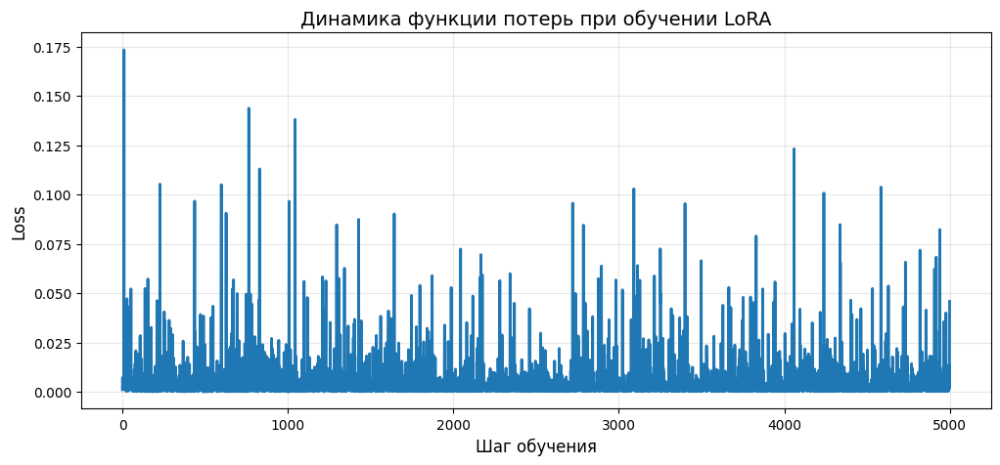

In [52]:
plt.figure(figsize=(12, 5))
plt.plot(losses, linewidth=2)
plt.xlabel("Шаг обучения", fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.title("Динамика функции потерь при обучении LoRA", fontsize=14)
plt.grid(True, alpha=0.3)
plt.savefig(f"{OUTPUT_DIR}/loss_curve.png", dpi=150)
plt.show()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

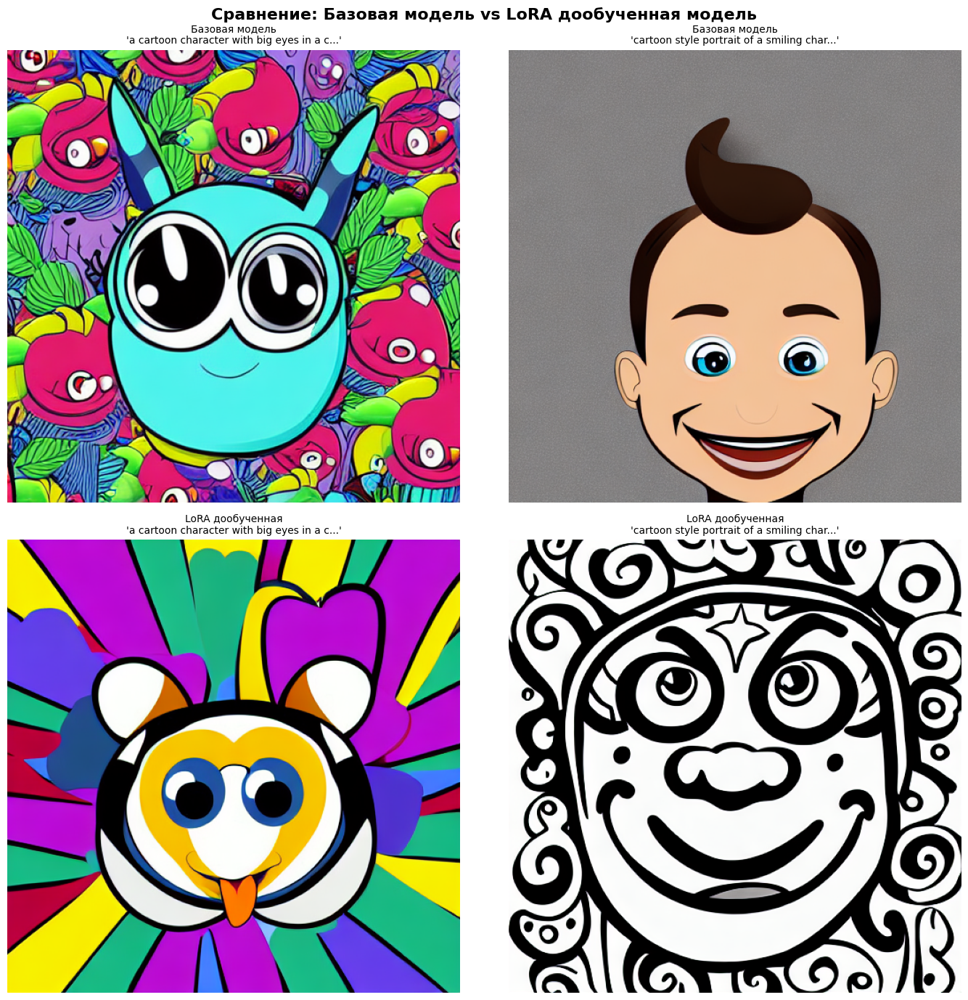

In [54]:
OUTPUT_DIR = "/content/output"

test_prompts = [
    "a cartoon character with big eyes in a colorful background",
    "cartoon style portrait of a smiling character",
    "animated character in bright colors"
]
negative_prompt = "blurry, bad quality, distorted, ugly"

pipe_base = StableDiffusionPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16
).to(device)

if torch.cuda.is_available():
    pipe_base.enable_xformers_memory_efficient_attention()

base_images = []
for prompt in test_prompts[:2]:
    img = pipe_base(
        prompt=prompt,
        negative_prompt=negative_prompt,
        num_inference_steps=30,
        guidance_scale=7.5,
        height=512,
        width=512
    ).images[0]
    base_images.append(img)

del pipe_base
torch.cuda.empty_cache()

pipe_lora = StableDiffusionPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16
).to(device)

pipe_lora.unet = PeftModel.from_pretrained(
    pipe_lora.unet,
    f"{OUTPUT_DIR}/lora_unet"
)

pipe_lora.text_encoder = PeftModel.from_pretrained(
    pipe_lora.text_encoder,
    f"{OUTPUT_DIR}/lora_text_encoder"
)

if torch.cuda.is_available():
    pipe_lora.enable_xformers_memory_efficient_attention()

lora_images = []
for prompt in test_prompts[:2]:
    img = pipe_lora(
        prompt=prompt,
        negative_prompt=negative_prompt,
        num_inference_steps=30,
        guidance_scale=7.5,
        height=512,
        width=512
    ).images[0]
    lora_images.append(img)

fig, axes = plt.subplots(2, 2, figsize=(14, 14))
fig.suptitle("Сравнение: Базовая модель vs LoRA дообученная модель", fontsize=16, fontweight='bold')

for i in range(2):
    axes[0, i].imshow(base_images[i])
    axes[0, i].set_title(f"Базовая модель\n'{test_prompts[i][:40]}...'", fontsize=10)
    axes[0, i].axis("off")
    axes[1, i].imshow(lora_images[i])
    axes[1, i].set_title(f"LoRA дообученная\n'{test_prompts[i][:40]}...'", fontsize=10)
    axes[1, i].axis("off")

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/comparison_before_after.png", dpi=150, bbox_inches='tight')
plt.show()

for i, (base_img, lora_img) in enumerate(zip(base_images, lora_images)):
    base_img.save(f"{OUTPUT_DIR}/base_sample_{i}.png")
    lora_img.save(f"{OUTPUT_DIR}/lora_sample_{i}.png")

Здесь используются два промпта: `"a cartoon character with big eyes in a colorful background"` и `"cartoon style portrait of a smiling character"`:
- По первому промпту базовая модель рисует соответствующего персонажа на ярком психоделическом фоне. Дообученная модель рисует похожее существо, но фон и вся композиция выглядят более упорядоченными.
- По второму промпту базовая модель выдаёт полуреалистичное изображение человека с мультяшными чертами, в то время как дообученная модель радикально меняет стиль рисунка, возможно, это обусловленно присутствующими в датасете линейными рисунками карандашом.

### [4 балла] Image Inpainting
В первой части задания (2 балла) вам предстоит обучить диффузионную модель решать задачу image inpainting. Для этого вам необходимо модифицировать код из семинара 2 следующий образом:
- Реализовать функцию генерации маски, можно использовать приведенную ниже или реализовать свою.
- Добавить в UNet новых 4 канала, куда подавать замаскированное изображение и маску.
- Запустить обучение.

---

**Ожидаемый результат.** В качестве результатов модели, от вас требуется предоставить визуализации генераций, полученных от вашей модели и код обучения модели.

In [29]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from diffusers import DDPMScheduler, UNet2DModel
from datasets import load_dataset
from torch.utils.data import DataLoader
from torchvision import transforms
from tqdm.auto import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import os

In [21]:
import numpy as np

class RectangleGenerator:
    """
    Generates for each object a mask where unobserved region is
    a rectangle which square divided by the image square is in
    interval [min_rect_rel_square, max_rect_rel_square].
    """
    def __init__(self, min_rect_rel_square=0.3, max_rect_rel_square=1):
        self.min_rect_rel_square = min_rect_rel_square
        self.max_rect_rel_square = max_rect_rel_square

    def gen_coordinates(self, width, height):
        x1, x2 = np.random.randint(0, width, 2)
        y1, y2 = np.random.randint(0, height, 2)
        x1, x2 = min(x1, x2), max(x1, x2)
        y1, y2 = min(y1, y2), max(y1, y2)
        return int(x1), int(y1), int(x2), int(y2)

    def __call__(self, batch):
        batch_size, num_channels, width, height = batch.shape
        mask = torch.zeros_like(batch)
        for i in range(batch_size):
            x1, y1, x2, y2 = self.gen_coordinates(width, height)
            sqr = width * height
            while not (self.min_rect_rel_square * sqr <=
                       (x2 - x1 + 1) * (y2 - y1 + 1) <=
                       self.max_rect_rel_square * sqr):
                x1, y1, x2, y2 = self.gen_coordinates(width, height)
            mask[i, :, x1: x2 + 1, y1: y2 + 1] = 1
        return mask

In [22]:
OUTPUT_DIR = "/content/inpainting_output"
DATASET_NAME = "Norod78/cartoon-blip-captions"
RESOLUTION = 64
TRAIN_BATCH_SIZE = 4
GRADIENT_ACCUMULATION_STEPS = 2
NUM_EPOCHS = 5
LEARNING_RATE = 1e-4
MAX_TRAIN_SAMPLES = 500
SAVE_STEPS = 100
os.makedirs(OUTPUT_DIR, exist_ok=True)
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Устройство: {device}")

Устройство: cuda


In [23]:
mask_generator = RectangleGenerator(min_rect_rel_square=0.2, max_rect_rel_square=0.5)

In [24]:
dataset = load_dataset(DATASET_NAME, split="train")
if MAX_TRAIN_SAMPLES:
    dataset = dataset.select(range(min(MAX_TRAIN_SAMPLES, len(dataset))))

print(f"Размер датасета: {len(dataset)}")

Размер датасета: 500


In [25]:
preprocess = transforms.Compose([
    transforms.Resize(RESOLUTION, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.CenterCrop(RESOLUTION),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5]),
])

class InpaintingDataset(torch.utils.data.Dataset):
    def __init__(self, hf_dataset, transform):
        self.dataset = hf_dataset
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = item["image"].convert("RGB")
        pixel_values = self.transform(image)
        return {"pixel_values": pixel_values}

In [26]:
custom_dataset = InpaintingDataset(dataset, preprocess)

def collate_fn(examples):
    pixel_values = torch.stack([example["pixel_values"] for example in examples])
    return {"pixel_values": pixel_values}

train_dataloader = DataLoader(
    custom_dataset,
    batch_size=TRAIN_BATCH_SIZE,
    shuffle=True,
    collate_fn=collate_fn,
    num_workers=2
)

In [28]:
class InpaintingUNet(nn.Module):

    def __init__(self, base_unet):
        super().__init__()
        self.base_unet = base_unet

        old_conv = self.base_unet.conv_in

        self.base_unet.conv_in = nn.Conv2d(
            9,
            old_conv.out_channels,
            kernel_size=old_conv.kernel_size,
            stride=old_conv.stride,
            padding=old_conv.padding
        )

        with torch.no_grad():
            self.base_unet.conv_in.weight[:, :3, :, :] = old_conv.weight
            self.base_unet.conv_in.weight[:, 3:, :, :] = 0
            if old_conv.bias is not None:
                self.base_unet.conv_in.bias = old_conv.bias

    def forward(self, noisy_latents, timesteps, masked_images, masks):
        model_input = torch.cat([noisy_latents, masked_images, masks], dim=1)
        return self.base_unet(model_input, timesteps).sample

In [30]:
base_unet = UNet2DModel(
    sample_size=RESOLUTION,
    in_channels=3,
    out_channels=3,
    layers_per_block=2,
    block_out_channels=(128, 128, 256, 256, 512, 512),
    down_block_types=(
        "DownBlock2D",
        "DownBlock2D",
        "DownBlock2D",
        "DownBlock2D",
        "AttnDownBlock2D",
        "DownBlock2D",
    ),
    up_block_types=(
        "UpBlock2D",
        "AttnUpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
        "UpBlock2D",
    ),
)

unet = InpaintingUNet(base_unet)
unet.to(device)

noise_scheduler = DDPMScheduler(num_train_timesteps=1000)

optimizer = torch.optim.AdamW(
    unet.parameters(),
    lr=LEARNING_RATE,
    betas=(0.9, 0.999),
    weight_decay=1e-2,
)

In [39]:
def train_loop():
    global_step = 0
    losses = []

    for epoch in range(NUM_EPOCHS):
        unet.train()
        progress_bar = tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}")

        for step, batch in enumerate(progress_bar):
            clean_images = batch["pixel_values"].to(device)
            masks = mask_generator(clean_images).to(device)
            masked_images = clean_images * (1 - masks) - masks

            noise = torch.randn_like(clean_images)
            timesteps = torch.randint(
                0, noise_scheduler.config.num_train_timesteps,
                (clean_images.shape[0],), device=device
            ).long()

            noisy_images = noise_scheduler.add_noise(clean_images, noise, timesteps)
            noise_pred = unet(noisy_images, timesteps, masked_images, masks)

            #loss = F.mse_loss(noise_pred, noise)
            loss_masked = F.mse_loss(noise_pred * masks, noise * masks)
            loss = 0.9 * loss_masked + 0.1 * F.mse_loss(noise_pred, noise)
            loss = loss / GRADIENT_ACCUMULATION_STEPS
            loss.backward()

            if (step + 1) % GRADIENT_ACCUMULATION_STEPS == 0:
                torch.nn.utils.clip_grad_norm_(unet.parameters(), 1.0)
                optimizer.step()
                optimizer.zero_grad()

            losses.append(loss.item() * GRADIENT_ACCUMULATION_STEPS)
            progress_bar.set_postfix({"loss": f"{loss.item() * GRADIENT_ACCUMULATION_STEPS:.4f}"})

            global_step += 1

            if global_step % SAVE_STEPS == 0:
                save_path = f"{OUTPUT_DIR}/checkpoint-{global_step}.pth"
                torch.save({
                    'model_state_dict': unet.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'step': global_step,
                }, save_path)
                print(f"\nСохранён чекпоинт: {save_path}")

            if global_step % 50 == 0:
                torch.cuda.empty_cache()

    torch.save(unet.state_dict(), f"{OUTPUT_DIR}/final_model.pth")

    return losses

In [40]:
losses = train_loop()

Epoch 1/5:   0%|          | 0/125 [00:00<?, ?it/s]


Сохранён чекпоинт: /content/inpainting_output/checkpoint-100.pth


Epoch 2/5:   0%|          | 0/125 [00:00<?, ?it/s]


Сохранён чекпоинт: /content/inpainting_output/checkpoint-200.pth


Epoch 3/5:   0%|          | 0/125 [00:00<?, ?it/s]


Сохранён чекпоинт: /content/inpainting_output/checkpoint-300.pth


Epoch 4/5:   0%|          | 0/125 [00:00<?, ?it/s]


Сохранён чекпоинт: /content/inpainting_output/checkpoint-400.pth

Сохранён чекпоинт: /content/inpainting_output/checkpoint-500.pth


Epoch 5/5:   0%|          | 0/125 [00:00<?, ?it/s]


Сохранён чекпоинт: /content/inpainting_output/checkpoint-600.pth
Обучение завершено!


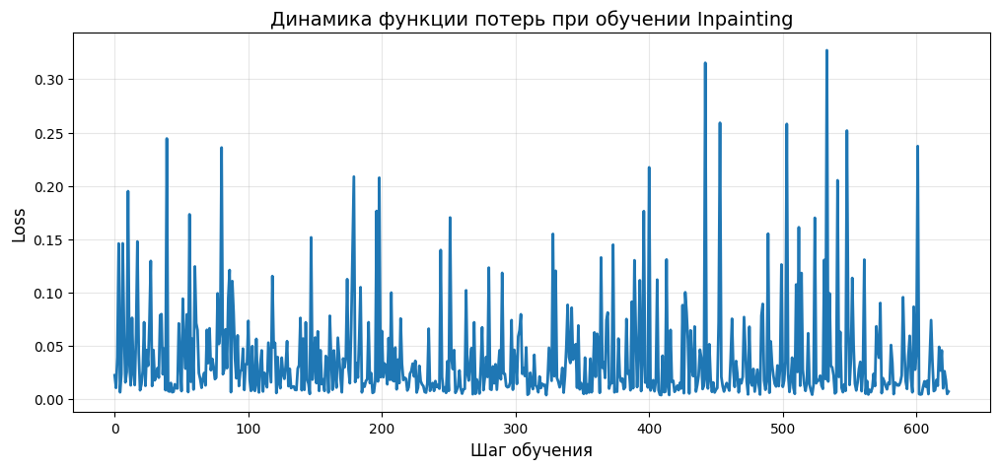

In [41]:
plt.figure(figsize=(12, 5))
plt.plot(losses, linewidth=2)
plt.xlabel("Шаг обучения", fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.title("Динамика функции потерь при обучении Inpainting", fontsize=14)
plt.grid(True, alpha=0.3)
plt.savefig(f"{OUTPUT_DIR}/loss_curve.png", dpi=150)
plt.show()

In [42]:
unet.load_state_dict(torch.load(f"{OUTPUT_DIR}/final_model.pth"))
unet.eval()

@torch.no_grad()
def inpaint_image(image, mask, num_inference_steps=50):
    device = image.device
    masked_image = image * (1 - mask) - mask
    latent = torch.randn_like(image)

    noise_scheduler.set_timesteps(num_inference_steps)

    for i, t in enumerate(tqdm(noise_scheduler.timesteps, desc="Inpainting")):
        timestep = torch.tensor([t], device=device).long()
        noise_pred = unet(latent, timestep, masked_image, mask)
        latent = noise_scheduler.step(noise_pred, t, latent).prev_sample

        if i < len(noise_scheduler.timesteps) - 1:
            noise = torch.randn_like(image)
            noisy_known = noise_scheduler.add_noise(image, noise, timestep)
            latent = latent * mask + noisy_known * (1 - mask)
        else:
            latent = latent * mask + image * (1 - mask)

    return latent

@torch.no_grad()
def inpaint_image_simple(image, mask, num_inference_steps=50):
    device = image.device
    masked_image = image * (1 - mask) - mask
    latent = image * (1 - mask) + torch.randn_like(image) * mask
    noise_scheduler.set_timesteps(num_inference_steps)

    for t in tqdm(noise_scheduler.timesteps, desc="Inpainting"):
        timestep = torch.tensor([t], device=device).long()
        noise_pred = unet(latent, timestep, masked_image, mask)
        latent = noise_scheduler.step(noise_pred, t, latent).prev_sample
        latent = latent * mask + image * (1 - mask)

    return latent

Inpainting:   0%|          | 0/50 [00:00<?, ?it/s]

Inpainting:   0%|          | 0/50 [00:00<?, ?it/s]

Inpainting:   0%|          | 0/50 [00:00<?, ?it/s]

Inpainting:   0%|          | 0/50 [00:00<?, ?it/s]

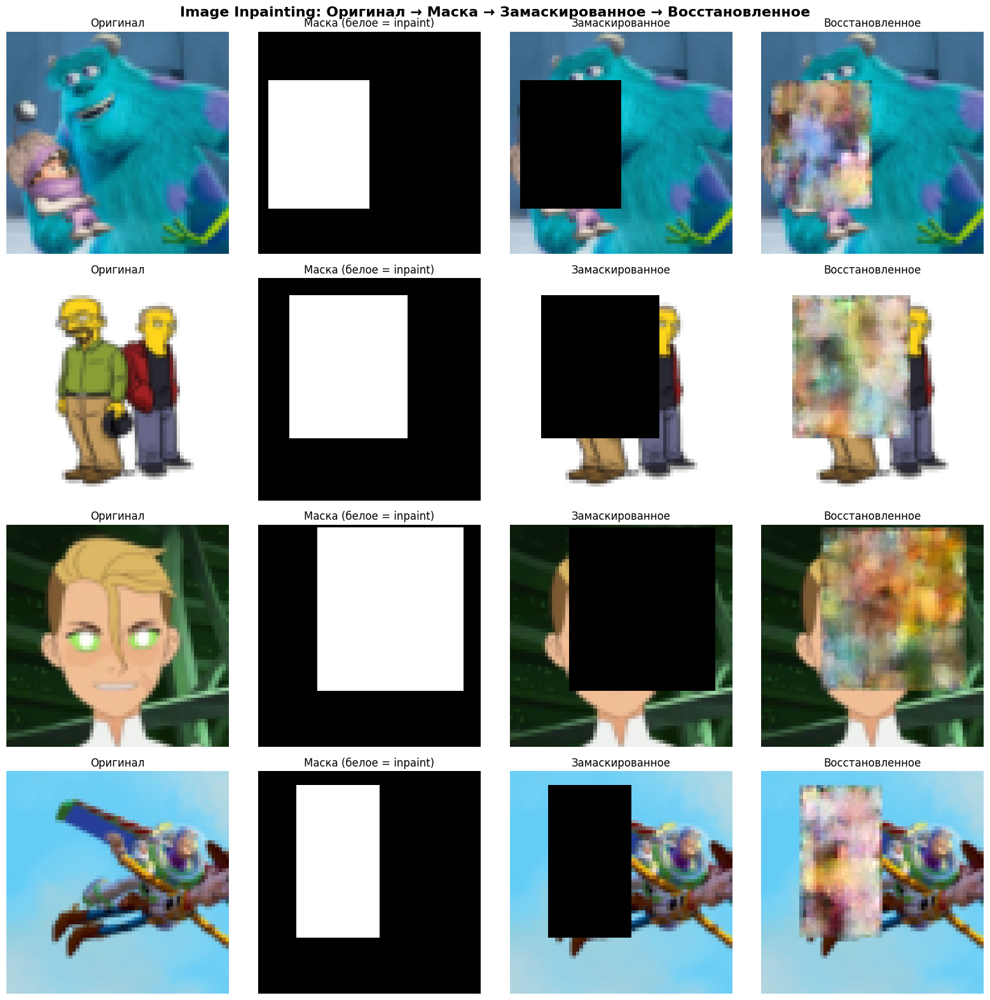

In [45]:
unet.load_state_dict(torch.load(f"{OUTPUT_DIR}/final_model.pth"))
unet.eval()

num_samples = 4
fig, axes = plt.subplots(num_samples, 4, figsize=(16, num_samples * 4))
fig.suptitle("Image Inpainting: Оригинал → Маска → Замаскированное → Восстановленное",
             fontsize=16, fontweight='bold')

for i in range(num_samples):
    sample_idx = np.random.randint(0, len(custom_dataset))
    sample = custom_dataset[sample_idx]
    image = sample["pixel_values"].unsqueeze(0).to(device)

    mask = mask_generator(image).to(device)
    masked_image = image * (1 - mask) - mask

    inpainted = inpaint_image(image, mask, num_inference_steps=50)

    def denorm(img):
        img = (img + 1) / 2
        img = torch.clamp(img, 0, 1)
        return img.cpu().permute(0, 2, 3, 1).numpy()[0]

    axes[i, 0].imshow(denorm(image))
    axes[i, 0].set_title("Оригинал")
    axes[i, 0].axis("off")

    mask_vis = mask[0, 0].cpu().numpy()
    axes[i, 1].imshow(mask_vis, cmap='gray')
    axes[i, 1].set_title("Маска (белое = inpaint)")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(denorm(masked_image))
    axes[i, 2].set_title("Замаскированное")
    axes[i, 2].axis("off")

    axes[i, 3].imshow(denorm(inpainted))
    axes[i, 3].set_title("Восстановленное")
    axes[i, 3].axis("off")

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/inpainting_results_fixed.png", dpi=150, bbox_inches='tight')
plt.show()

Восстановленные области выглядят как случайный шум и не соответствуют контексту изображения:
- Вероятно обучение модели с нуля на малом количестве и низком качестве данных не позволяет ей научиться осмысленно восстанавливать скрытые области.
- В условиях ограниченных ресурсов Colab нет возможности работать с достаточным количеством данных или экспериментировать с архитектурами и loss-функциями.

Во второй части задания (2 балла) вам предстоит провизуализировать результаты полученной модели inpainting и модели SD через [демо](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/in_painting_with_stable_diffusion_using_diffusers.ipynb#scrollTo=R596bpT2ynqV). Пример демо реализован ниже. Если у вас не получится реализовать модель из первого задания, то вы можете использовать модель SD и получите один балл

**Ожидаемый результат.** От вас ожидается анализ кейсов, когда модель отрабатывает хорошо (например, определенный тип масок), а когда плохо.

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

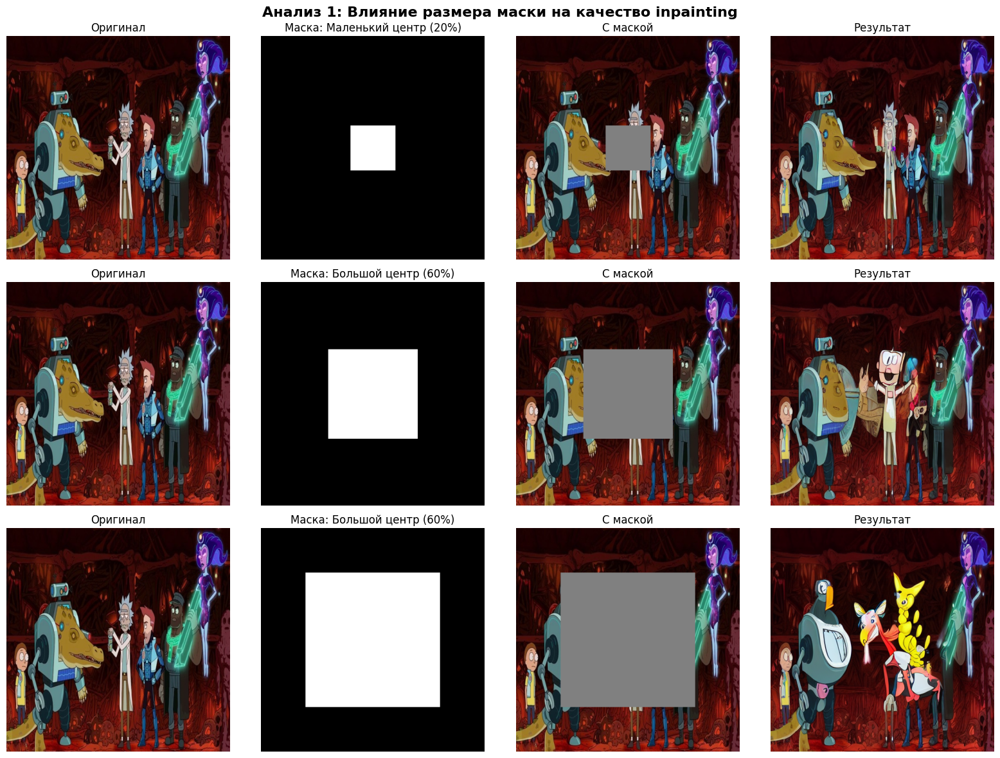

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

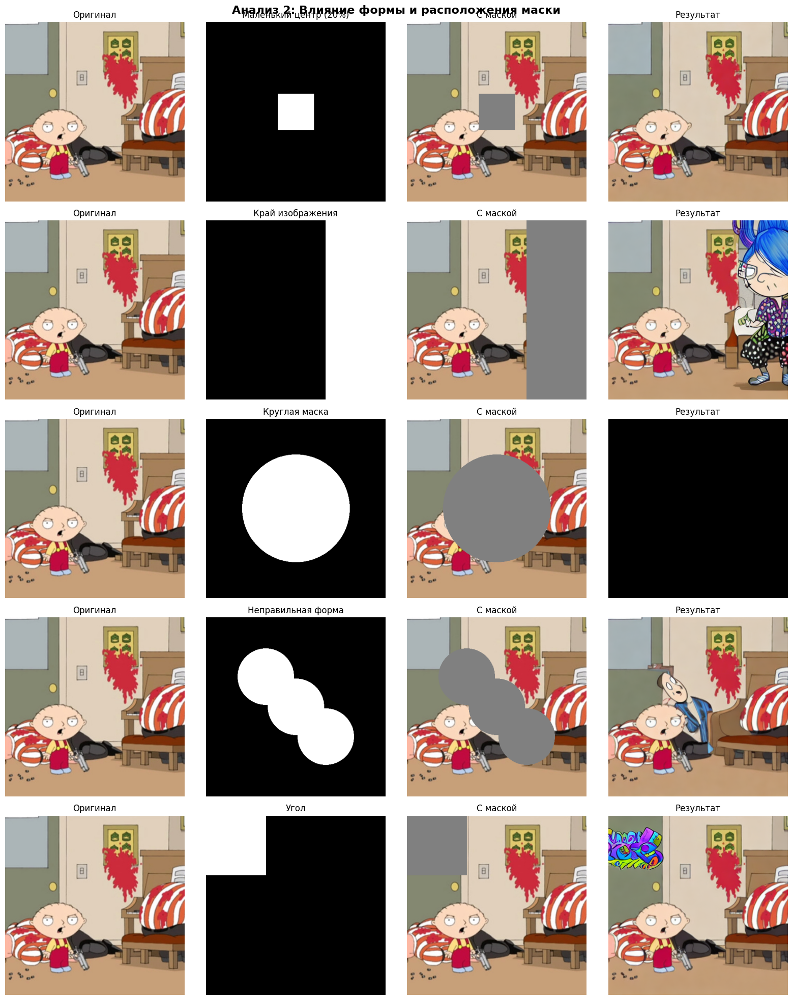

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

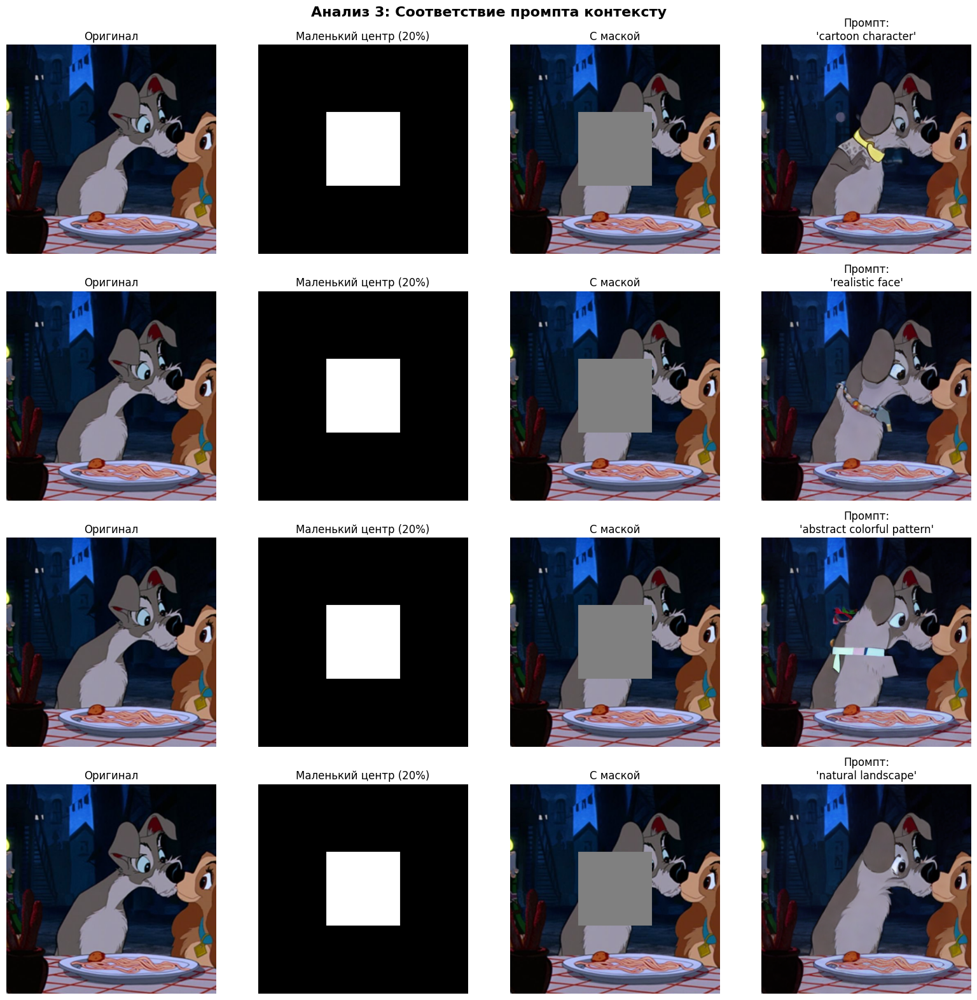

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

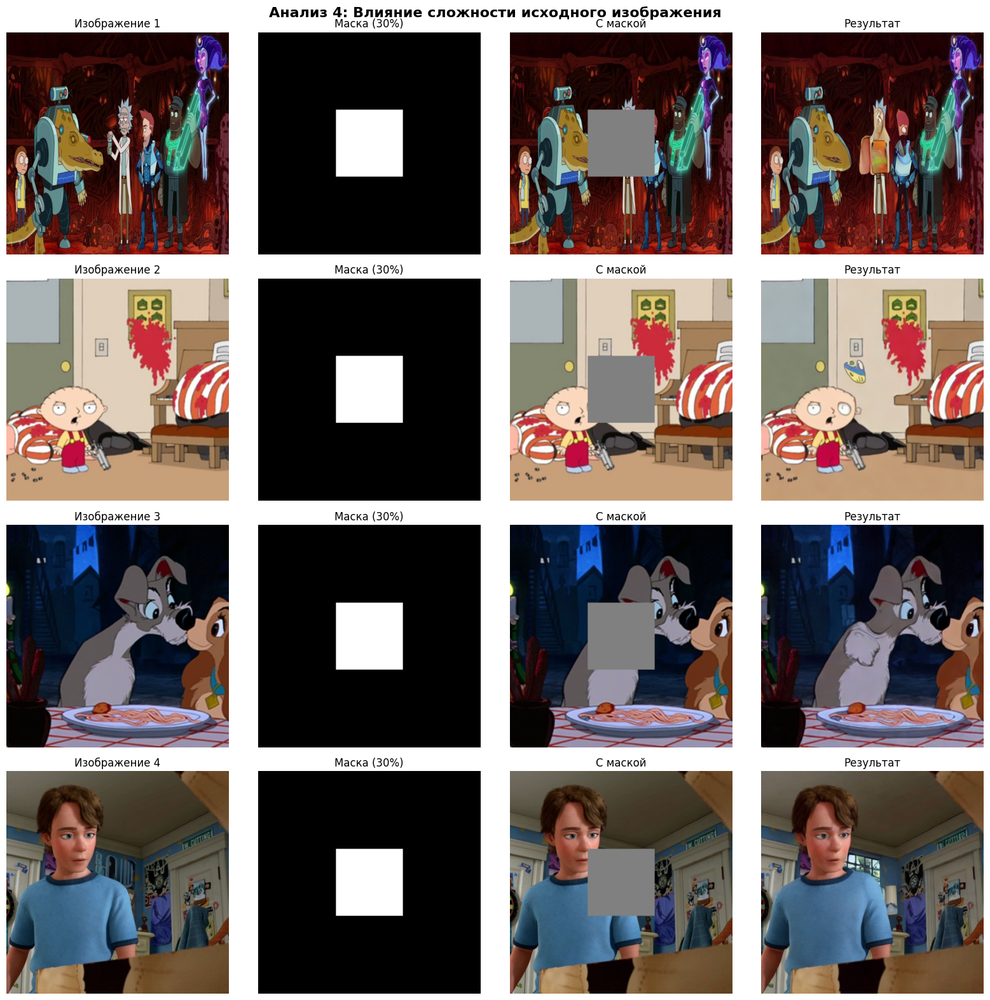

In [50]:
device = "cuda" if torch.cuda.is_available() else "cpu"
OUTPUT_DIR = "/content/inpainting_analysis"
os.makedirs(OUTPUT_DIR, exist_ok=True)

pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    torch_dtype=torch.float16,
).to(device)

pipe.enable_attention_slicing()
if torch.cuda.is_available():
    pipe.enable_xformers_memory_efficient_attention()

dataset = load_dataset("Norod78/cartoon-blip-captions", split="train")
dataset = dataset.select(range(min(50, len(dataset))))

class MaskGenerators:

    @staticmethod
    def small_center_rectangle(image, size_ratio=0.2):
        """Маленький прямоугольник по центру (20% площади)"""
        width, height = image.size
        mask_w = int(width * size_ratio)
        mask_h = int(height * size_ratio)

        x1 = (width - mask_w) // 2
        y1 = (height - mask_h) // 2

        mask = Image.new("RGB", (width, height), "black")
        draw = ImageDraw.Draw(mask)
        draw.rectangle([x1, y1, x1 + mask_w, y1 + mask_h], fill="white")
        return mask, "Маленький центр (20%)"

    @staticmethod
    def large_center_rectangle(image, size_ratio=0.6):
        """Большой прямоугольник по центру (60% площади)"""
        width, height = image.size
        mask_w = int(width * size_ratio)
        mask_h = int(height * size_ratio)

        x1 = (width - mask_w) // 2
        y1 = (height - mask_h) // 2

        mask = Image.new("RGB", (width, height), "black")
        draw = ImageDraw.Draw(mask)
        draw.rectangle([x1, y1, x1 + mask_w, y1 + mask_h], fill="white")
        return mask, "Большой центр (60%)"

    @staticmethod
    def edge_rectangle(image):
        """Прямоугольник на краю изображения"""
        width, height = image.size

        mask = Image.new("RGB", (width, height), "black")
        draw = ImageDraw.Draw(mask)
        draw.rectangle([width * 2 // 3, 0, width, height], fill="white")
        return mask, "Край изображения"

    @staticmethod
    def multiple_small_regions(image, num_regions=3):
        """Несколько маленьких областей"""
        width, height = image.size
        mask = Image.new("RGB", (width, height), "black")
        draw = ImageDraw.Draw(mask)

        for _ in range(num_regions):
            x = np.random.randint(0, width - 100)
            y = np.random.randint(0, height - 100)
            size = np.random.randint(50, 100)
            draw.rectangle([x, y, x + size, y + size], fill="white")

        return mask, "Множественные области"

    @staticmethod
    def circular_mask(image, radius_ratio=0.3):
        """Круглая маска"""
        width, height = image.size
        radius = int(min(width, height) * radius_ratio)
        center_x, center_y = width // 2, height // 2

        mask = Image.new("RGB", (width, height), "black")
        draw = ImageDraw.Draw(mask)
        draw.ellipse(
            [center_x - radius, center_y - radius,
             center_x + radius, center_y + radius],
            fill="white"
        )
        return mask, "Круглая маска"

    @staticmethod
    def irregular_shape(image):
        """Неправильная форма (несколько соединённых кругов)"""
        width, height = image.size
        mask = Image.new("RGB", (width, height), "black")
        draw = ImageDraw.Draw(mask)

        centers = [
            (width // 3, height // 3),
            (width // 2, height // 2),
            (2 * width // 3, 2 * height // 3)
        ]

        for cx, cy in centers:
            radius = 80
            draw.ellipse([cx - radius, cy - radius, cx + radius, cy + radius], fill="white")

        return mask, "Неправильная форма"

    @staticmethod
    def thin_strip(image):
        """Тонкая полоса"""
        width, height = image.size
        mask = Image.new("RGB", (width, height), "black")
        draw = ImageDraw.Draw(mask)
        strip_height = height // 10
        y_start = height // 2 - strip_height // 2
        draw.rectangle([0, y_start, width, y_start + strip_height], fill="white")

        return mask, "Тонкая полоса"

    @staticmethod
    def corner_mask(image):
        """Угол изображения"""
        width, height = image.size
        mask = Image.new("RGB", (width, height), "black")
        draw = ImageDraw.Draw(mask)
        size = min(width, height) // 3
        draw.rectangle([0, 0, size, size], fill="white")

        return mask, "Угол"

def test_inpainting_scenario(image, mask_func, prompts, scenario_name):
    """
    Тестирует один сценарий с разными промптами
    """
    results = []
    mask, mask_name = mask_func(image)

    for prompt in prompts:
        inpainted = pipe(
            prompt=prompt,
            image=image,
            mask_image=mask,
            num_inference_steps=30,
            guidance_scale=7.5
        ).images[0]

        results.append({
            'original': image,
            'mask': mask,
            'prompt': prompt,
            'result': inpainted,
            'mask_name': mask_name
        })

    return results

test_images = []
for i in [5, 15, 25, 35]:
    sample = dataset[i]
    img = sample["image"].convert("RGB").resize((512, 512))
    test_images.append(img)

mask_generators_by_size = [
    MaskGenerators.small_center_rectangle,
    lambda img: MaskGenerators.large_center_rectangle(img, size_ratio=0.4),
    lambda img: MaskGenerators.large_center_rectangle(img, size_ratio=0.6),
]

prompts_simple = ["colorful cartoon character", "vibrant abstract pattern"]

fig, axes = plt.subplots(len(mask_generators_by_size), 4, figsize=(16, 12))
fig.suptitle("Анализ 1: Влияние размера маски на качество inpainting", fontsize=16, fontweight='bold')

for i, mask_gen in enumerate(mask_generators_by_size):
    img = test_images[0]
    mask, mask_name = mask_gen(img)

    result = pipe(
        prompt=prompts_simple[0],
        image=img,
        mask_image=mask,
        num_inference_steps=30,
        guidance_scale=7.5
    ).images[0]

    mask_array = np.array(mask.convert("L")) > 128
    masked_img_array = np.array(img.copy())
    masked_img_array[mask_array] = 128
    masked_img = Image.fromarray(masked_img_array)

    axes[i, 0].imshow(img)
    axes[i, 0].set_title("Оригинал")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(mask)
    axes[i, 1].set_title(f"Маска: {mask_name}")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(masked_img)
    axes[i, 2].set_title("С маской")
    axes[i, 2].axis("off")

    axes[i, 3].imshow(result)
    axes[i, 3].set_title("Результат")
    axes[i, 3].axis("off")

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/analysis_1_mask_size.png", dpi=150, bbox_inches='tight')
plt.show()

mask_generators_by_shape = [
    MaskGenerators.small_center_rectangle,
    MaskGenerators.edge_rectangle,
    MaskGenerators.circular_mask,
    MaskGenerators.irregular_shape,
    MaskGenerators.corner_mask,
]

fig, axes = plt.subplots(len(mask_generators_by_shape), 4, figsize=(16, 20))
fig.suptitle("Анализ 2: Влияние формы и расположения маски", fontsize=16, fontweight='bold')

for i, mask_gen in enumerate(mask_generators_by_shape):
    img = test_images[1]
    mask, mask_name = mask_gen(img)

    result = pipe(
        prompt="cartoon style, vibrant colors",
        image=img,
        mask_image=mask,
        num_inference_steps=30,
        guidance_scale=7.5
    ).images[0]

    mask_array = np.array(mask.convert("L")) > 128
    masked_img_array = np.array(img.copy())
    masked_img_array[mask_array] = 128
    masked_img = Image.fromarray(masked_img_array)

    axes[i, 0].imshow(img)
    axes[i, 0].set_title("Оригинал")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(mask)
    axes[i, 1].set_title(f"{mask_name}")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(masked_img)
    axes[i, 2].set_title("С маской")
    axes[i, 2].axis("off")

    axes[i, 3].imshow(result)
    axes[i, 3].set_title("Результат")
    axes[i, 3].axis("off")

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/analysis_2_mask_shape.png", dpi=150, bbox_inches='tight')
plt.show()

prompts_varied = [
    "cartoon character",
    "realistic face",
    "abstract colorful pattern",
    "natural landscape",
]

fig, axes = plt.subplots(len(prompts_varied), 4, figsize=(16, 16))
fig.suptitle("Анализ 3: Соответствие промпта контексту", fontsize=16, fontweight='bold')

img = test_images[2]
mask, mask_name = MaskGenerators.small_center_rectangle(img, size_ratio=0.35)

for i, prompt in enumerate(prompts_varied):
    result = pipe(
        prompt=prompt,
        image=img,
        mask_image=mask,
        num_inference_steps=30,
        guidance_scale=7.5
    ).images[0]

    mask_array = np.array(mask.convert("L")) > 128
    masked_img_array = np.array(img.copy())
    masked_img_array[mask_array] = 128
    masked_img = Image.fromarray(masked_img_array)

    axes[i, 0].imshow(img)
    axes[i, 0].set_title("Оригинал")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(mask)
    axes[i, 1].set_title(f"{mask_name}")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(masked_img)
    axes[i, 2].set_title("С маской")
    axes[i, 2].axis("off")

    axes[i, 3].imshow(result)
    axes[i, 3].set_title(f"Промпт:\n'{prompt}'")
    axes[i, 3].axis("off")

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/analysis_3_prompt_context.png", dpi=150, bbox_inches='tight')
plt.show()

fig, axes = plt.subplots(len(test_images), 4, figsize=(16, 16))
fig.suptitle("Анализ 4: Влияние сложности исходного изображения", fontsize=16, fontweight='bold')

for i, img in enumerate(test_images):
    mask, mask_name = MaskGenerators.small_center_rectangle(img, size_ratio=0.3)

    result = pipe(
        prompt="cartoon style object",
        image=img,
        mask_image=mask,
        num_inference_steps=30,
        guidance_scale=7.5
    ).images[0]

    mask_array = np.array(mask.convert("L")) > 128
    masked_img_array = np.array(img.copy())
    masked_img_array[mask_array] = 128
    masked_img = Image.fromarray(masked_img_array)

    axes[i, 0].imshow(img)
    axes[i, 0].set_title(f"Изображение {i+1}")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(mask)
    axes[i, 1].set_title("Маска (30%)")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(masked_img)
    axes[i, 2].set_title("С маской")
    axes[i, 2].axis("off")

    axes[i, 3].imshow(result)
    axes[i, 3].set_title("Результат")
    axes[i, 3].axis("off")

plt.tight_layout()
plt.savefig(f"{OUTPUT_DIR}/analysis_4_background_complexity.png", dpi=150, bbox_inches='tight')
plt.show()

Анализ 1: Влияние размера маски на качество inpainting.
- Качество заполнения зависит от количества контекста вокруг. Чем больше маска, тем неуместнее и нестабильнее становится результат.

Анализ 2: Влияние формы и расположения маски.
- SD уверенно справляется с простыми центральными масками, но даёт нестабильные результаты при сложных, больших или краевых масках. Характерные искажения появляются, если форма маски затрудняет интерполяцию семантики.​​

Анализ 3: Соответствие промпта контексту.
- Наиболее близким к оригиналу оказался промпт "natural landscape". Возможно, модель проигнорировала максимально несоответсвующий контексту изображения промпт и выбрала стратегию семантического завершения объекта на основе окружения. В других случаях модель дорисовывала элемент - ошейник, по стилистике примерно соответствующий промпту.

Анализ 4: Влияние сложности исходного изображения.
- Чем однороднее и проще фон, тем выше качество инпейнтинга. Сложные и многодетализированные сцены дают неожиданные элементы и неточные детали.